In [59]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

In [60]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

# Câu 1:
## Làm mờ ảnh với các kernel 3x3 và 5x5 


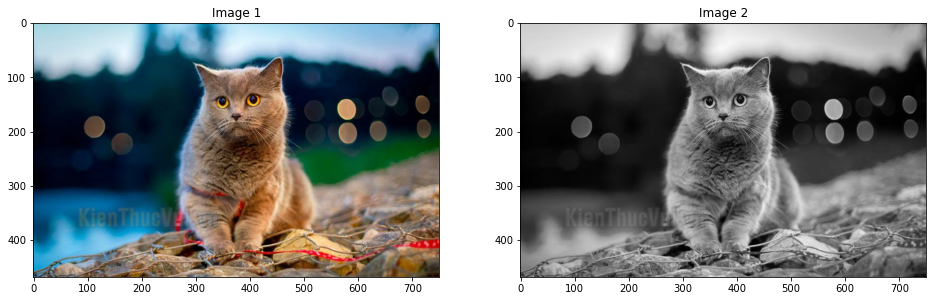

In [61]:
# Read Image 
image_color = imread("kitty.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

Filtering Kernel 3x3:


array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

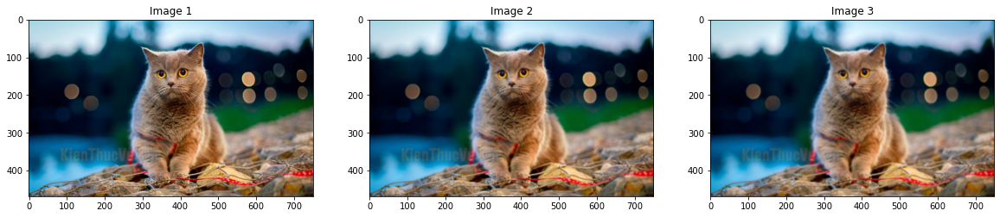

Filtering Kernel 5x5:


array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

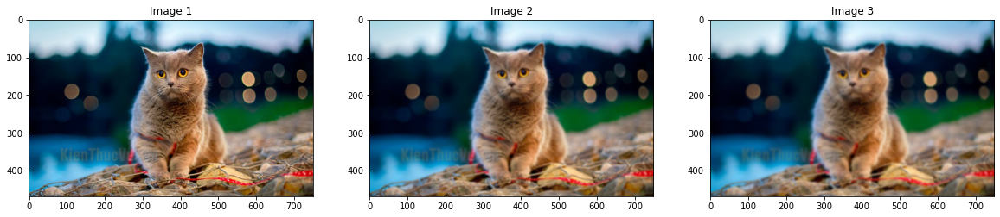

In [62]:
kernel_3_3 = np.ones((3,3),np.float32)/9
kernel_5_5 = np.ones((5,5),np.float32)/25
print("Filtering Kernel 3x3:")
display(kernel_3_3)

image_filter_3_3_01 = cv2.filter2D(image_color,-1,kernel_3_3)
image_filter_3_3_02 = cv2.filter2D(image_filter_3_3_01,-1,kernel_3_3)
ShowThreeImages(image_color, image_filter_3_3_01, image_filter_3_3_02)


print("Filtering Kernel 5x5:")
display(kernel_5_5)

image_filter_5_5_01 = cv2.filter2D(image_color,-1,kernel_5_5)
image_filter_5_5_02 = cv2.filter2D(image_filter_5_5_01,-1,kernel_5_5)


ShowThreeImages(image_color, image_filter_5_5_01, image_filter_5_5_02)

## Xuất giá trị đo mức độ mờ

In [63]:
def variance_of_laplacian(image):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    return cv2.Laplacian(image, cv2.CV_64F).var()

In [64]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)
blur_mesurement_3_3_02 = variance_of_laplacian(image_filter_3_3_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_3_3_01:", blur_mesurement_3_3_01)
print("Blur Measurement of image_filter_3_3_02:", blur_mesurement_3_3_02)

Blur Measurement of image_color: 311.9086384014532
Blur Measurement of image_filter_3_3_01: 43.816130167915624
Blur Measurement of image_filter_3_3_02: 20.10268634801333


In [65]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_5_5_01 = variance_of_laplacian(image_filter_5_5_01)
blur_mesurement_5_5_02 = variance_of_laplacian(image_filter_5_5_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_5_5_01:", blur_mesurement_5_5_01)
print("Blur Measurement of image_filter_5_5_02:", blur_mesurement_5_5_02)

Blur Measurement of image_color: 311.9086384014532
Blur Measurement of image_filter_5_5_01: 13.008461267520097
Blur Measurement of image_filter_5_5_02: 5.1496953069065405


## Viết dòng thông tin về giá trị mức độ mờ trên ảnh

### Ảnh 3x3

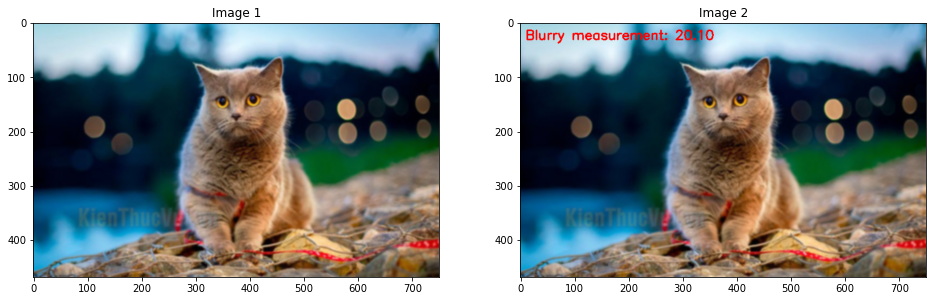

In [66]:
text = "Blurry measurement"
fm = blur_mesurement_3_3_02
image_filter_3_3_02_text = image_filter_3_3_02.copy()
cv2.putText(image_filter_3_3_02_text, "{}: {:.2f}".format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(image_filter_3_3_02, image_filter_3_3_02_text)

### Ảnh 5x5

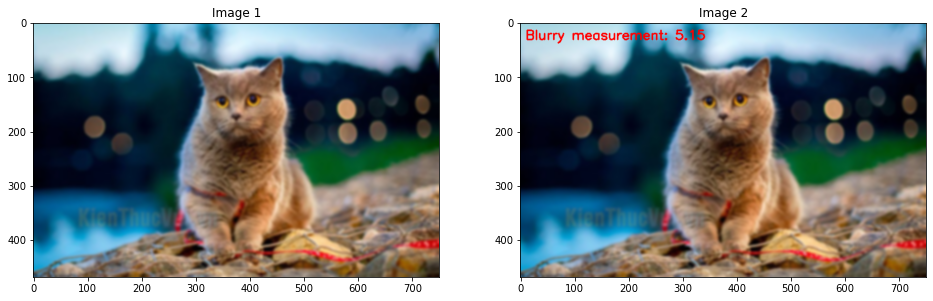

In [67]:
text = "Blurry measurement"
fm = blur_mesurement_5_5_02
image_filter_5_5_02_text = image_filter_5_5_02.copy()
cv2.putText(image_filter_5_5_02_text, "{}: {:.2f}".format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(image_filter_5_5_02, image_filter_5_5_02_text)

# Câu 2:
## Làm rõ ảnh với các kernel 3x3

Filtering kernel_sharpen_01:


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Filtering kernel_sharpen_02:


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

Image before sharpen:


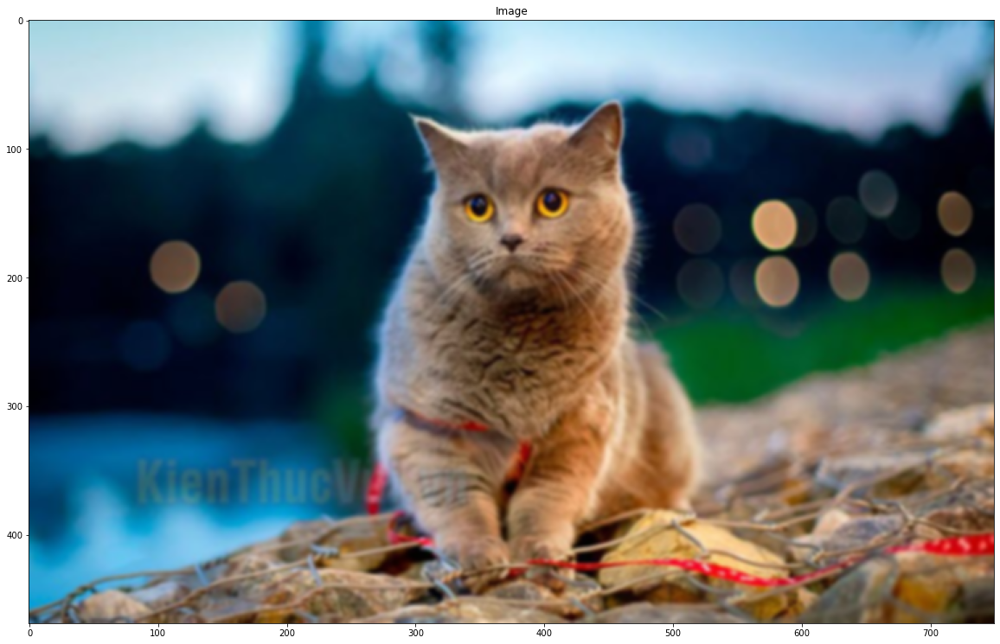

Image after sharpen:


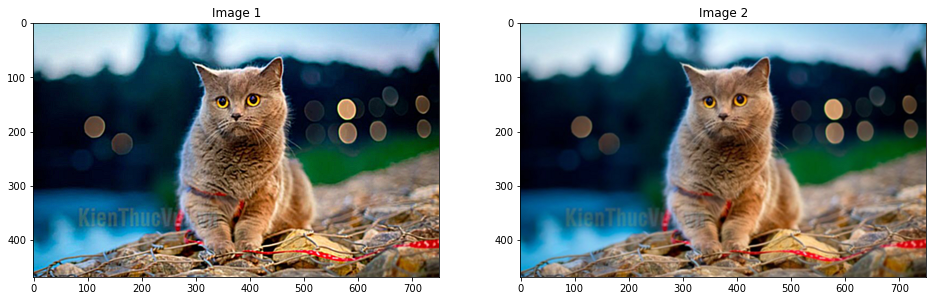

In [68]:
kernel_sharpen_01 = np.array([[-1,-1,-1], 
                              [-1, 9,-1], 
                              [-1,-1,-1]])

kernel_sharpen_02 = np.array(([0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]), dtype="int")

print("Filtering kernel_sharpen_01:")
display(kernel_sharpen_01)

print("Filtering kernel_sharpen_02:")
display(kernel_sharpen_02)

image_3_3_color_sharpen_01 = cv2.filter2D(image_filter_3_3_02, -1, kernel_sharpen_01)

image_3_3_color_sharpen_02 = cv2.filter2D(image_filter_3_3_02, -1, kernel_sharpen_02)

print("Image before sharpen:")
ShowOneImage(image_filter_3_3_02)

print("Image after sharpen:")
ShowTwoImages(image_3_3_color_sharpen_01, image_3_3_color_sharpen_02)

## Làm rõ ảnh với các kernel  5x5

Filtering kernel_sharpen_01:


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Filtering kernel_sharpen_02:


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

Image before sharpen:


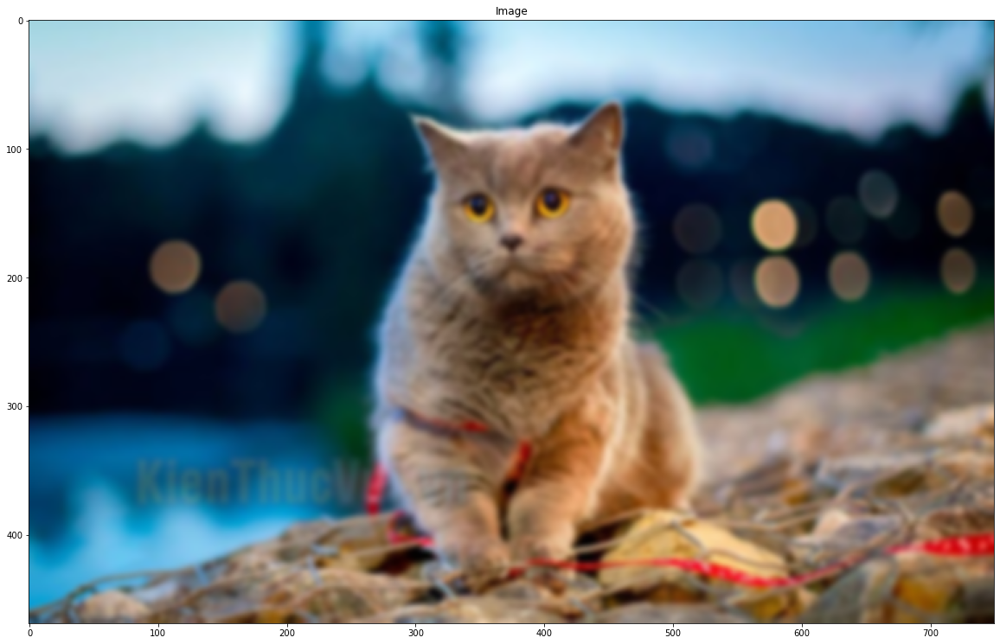

Image after sharpen:


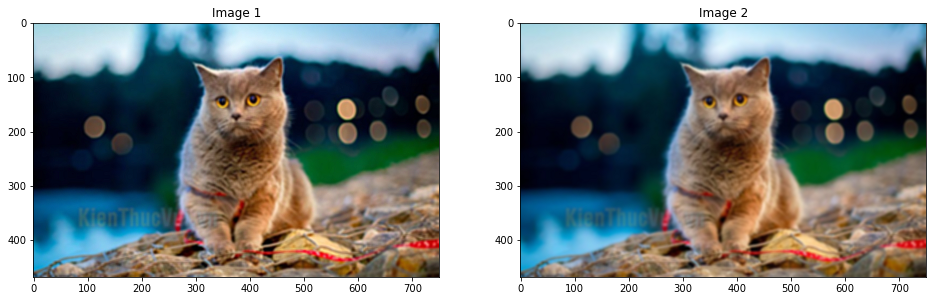

In [69]:
kernel_sharpen_01 = np.array([[-1,-1,-1], 
                              [-1, 9,-1], 
                              [-1,-1,-1]])

kernel_sharpen_02 = np.array(([0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]), dtype="int")

print("Filtering kernel_sharpen_01:")
display(kernel_sharpen_01)

print("Filtering kernel_sharpen_02:")
display(kernel_sharpen_02)

image_5_5_color_sharpen_01 = cv2.filter2D(image_filter_5_5_02, -1, kernel_sharpen_01)

image_5_5_color_sharpen_02 = cv2.filter2D(image_filter_5_5_02, -1, kernel_sharpen_02)

print("Image before sharpen:")
ShowOneImage(image_filter_5_5_02)

print("Image after sharpen:")
ShowTwoImages(image_5_5_color_sharpen_01, image_5_5_color_sharpen_02)

## Xuất giá trị đo mức độ rõ 

In [70]:
sharpen_mesurement = variance_of_laplacian(image_color)
sharpen_mesurement_3_3_01 = variance_of_laplacian(image_3_3_color_sharpen_01)
sharpen_mesurement_3_3_02 = variance_of_laplacian(image_3_3_color_sharpen_02)
print("Sharpen Measurement of image_color:", sharpen_mesurement)
print("Sharpen Measurement of image_3_3_color_sharpen_01:", sharpen_mesurement_3_3_01)
print("Sharpen Measurement of image_3_3_color_sharpen_02:", sharpen_mesurement_3_3_02)

Sharpen Measurement of image_color: 311.9086384014532
Sharpen Measurement of image_3_3_color_sharpen_01: 399.13584285735146
Sharpen Measurement of image_3_3_color_sharpen_02: 134.44787017056504


In [71]:
sharpen_mesurement = variance_of_laplacian(image_color)
sharpen_mesurement_5_5_01 = variance_of_laplacian(image_5_5_color_sharpen_01)
sharpen_mesurement_5_5_02 = variance_of_laplacian(image_5_5_color_sharpen_02)
print("Sharpen Measurement of image_color:", sharpen_mesurement)
print("Sharpen Measurement of image_5_5_color_sharpen_01:", sharpen_mesurement_5_5_01)
print("Sharpen Measurement of image_5_5_color_sharpen_02:", sharpen_mesurement_5_5_02)

Sharpen Measurement of image_color: 311.9086384014532
Sharpen Measurement of image_5_5_color_sharpen_01: 176.06379968069885
Sharpen Measurement of image_5_5_color_sharpen_02: 75.0551186832727


## Viết dòng thông tin về giá trị mức độ rõ trên ảnh 

### Ảnh 3x3

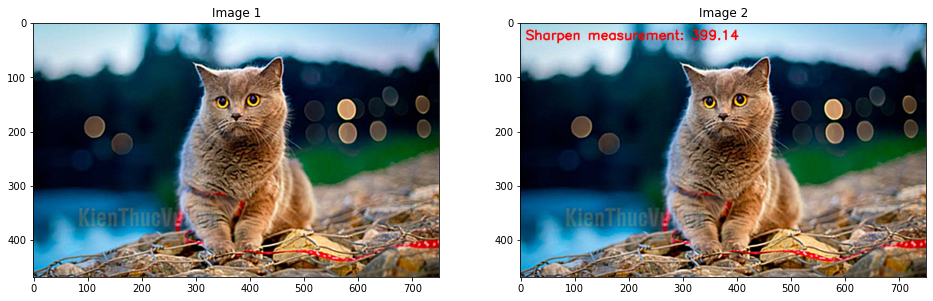

In [72]:
text = "Sharpen measurement"
fm = sharpen_mesurement_3_3_01
image_sharpen_3_3_01_text = image_3_3_color_sharpen_01.copy()
cv2.putText(image_sharpen_3_3_01_text, "{}: {:.2f}".format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(image_3_3_color_sharpen_01, image_sharpen_3_3_01_text)

### Ảnh 5x5

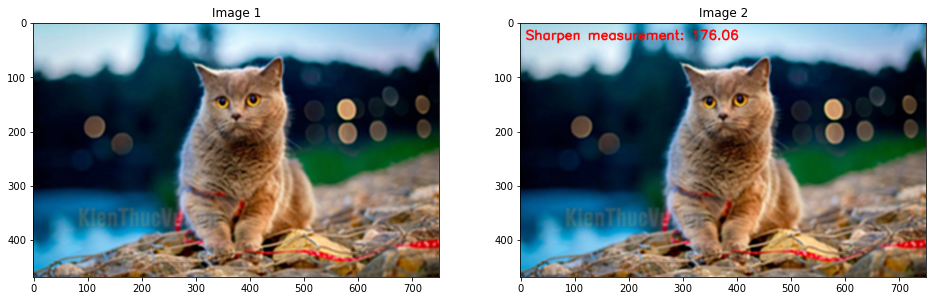

In [73]:
text = "Sharpen measurement"
fm = sharpen_mesurement_5_5_01
image_sharpen_5_5_01_text = image_5_5_color_sharpen_01.copy()
cv2.putText(image_sharpen_5_5_01_text, "{}: {:.2f}".format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(image_5_5_color_sharpen_01, image_sharpen_5_5_01_text)

# Câu 3:

## Viết hàm đọc toàn bộ ảnh trong thư mục “Image_Input” đó vào một List ảnh (Gợi ý : tìm internet cách đọc thư mục) 

In [74]:
def ReadFolder(path):
    import os
    dir_list = os.listdir(path)
    return dir_list

In [75]:
# import OS module
import os
 
# Get the list of all files and directories
path = "D:\TNHien\ĐH-KHTN\Phân tích & Xử lý ảnh\Lab03\Image_Input"
list_images = ReadFolder(path)
print(list_images)


['b-cat.jpg', 'b-dog.jpg', 'bird.jpg', 'dog.jpg', 'kitty.jpg']


## Định nghĩa ngưỡng mờ dựa trên giá độ đo mờ


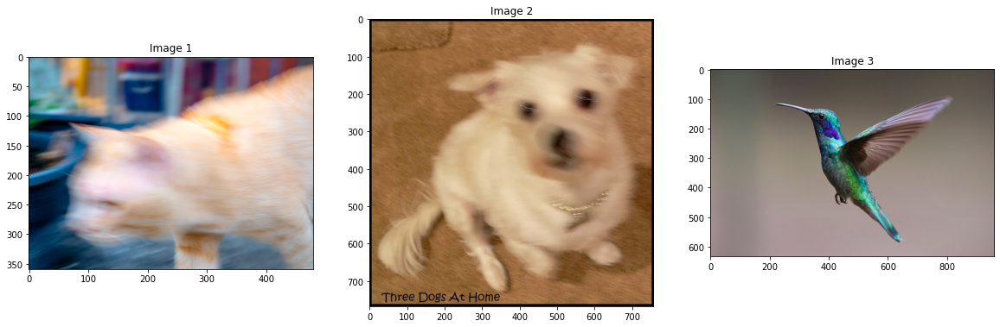

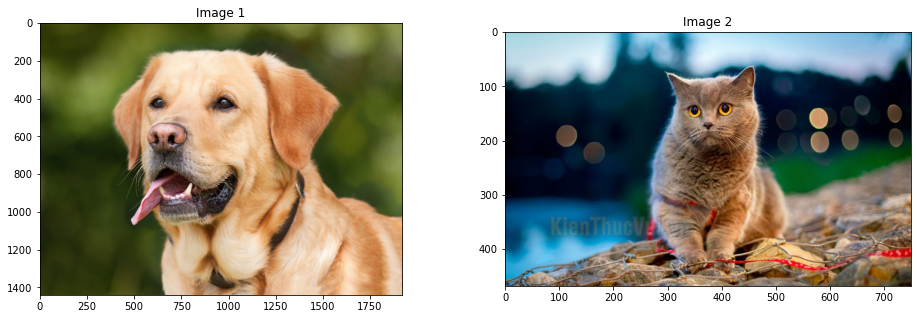

In [76]:
img_0 = imread(list_images[0])
img_1 = imread(list_images[1])
img_2 = imread(list_images[2])
img_3 = imread(list_images[3])
img_4 = imread(list_images[4])
    
ShowThreeImages(img_0, img_1, img_2)
ShowTwoImages(img_3, img_4)

In [77]:
blur_mesurement_0 = variance_of_laplacian(img_0)
blur_mesurement_1 = variance_of_laplacian(img_1)
blur_mesurement_2 = variance_of_laplacian(img_2)
blur_mesurement_3 = variance_of_laplacian(img_3)
blur_mesurement_4 = variance_of_laplacian(img_4)

print("Blur Measurement of image_color:", blur_mesurement_0)
print("Blur Measurement of image_color:", blur_mesurement_1)
print("Blur Measurement of image_color:", blur_mesurement_2)
print("Blur Measurement of image_color:", blur_mesurement_3)
print("Blur Measurement of image_color:", blur_mesurement_4)

Blur Measurement of image_color: 35.138564695254765
Blur Measurement of image_color: 134.226597604035
Blur Measurement of image_color: 239.85614285688962
Blur Measurement of image_color: 490.9703733907311
Blur Measurement of image_color: 311.9086384014532


### $\rightarrow$ Qua đó, nếu Blur Meansure < 200 là ảnh mờ. 
### $\rightarrow$ Ngược lại, nếu Blur Meansure > 200 là ảnh sắc nét.


## Đọc lần lượt các ảnh : Nếu ảnh nào ngoài ngưỡng mờ, ta ghi một dòng thông tin trên ảnh là “Blur Image :” kèm giá trị mờ. 
## Nếu ảnh nào tốt thì ta ghi “Good Image” trên ảnh. 

In [78]:
blur_img1 = img_0
blur_img2 = img_1

gud_img3 = img_2
gud_img4 = img_3
gud_img5 = img_4

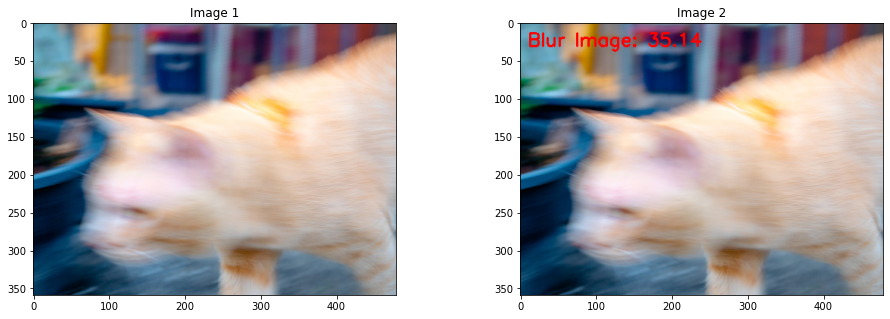

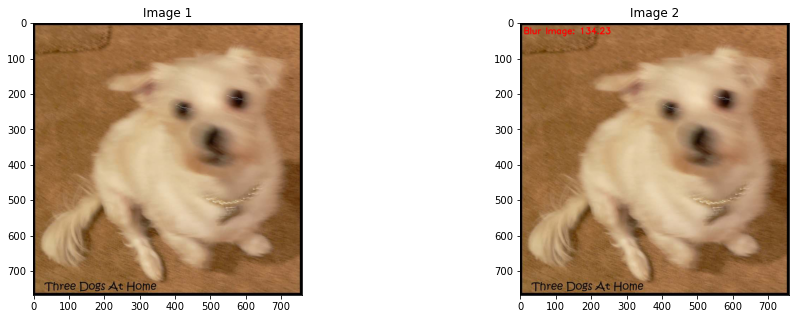

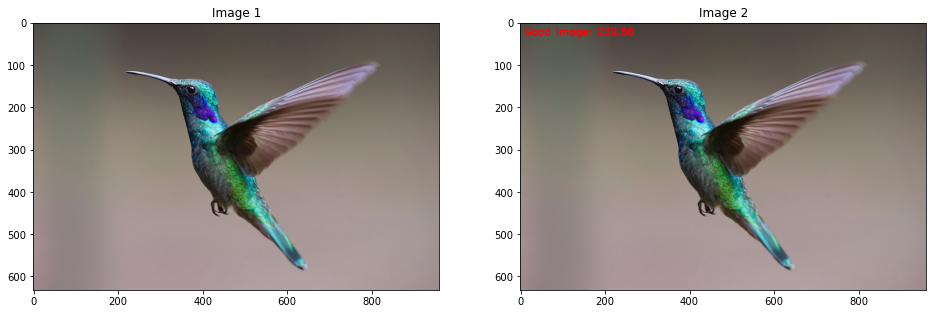

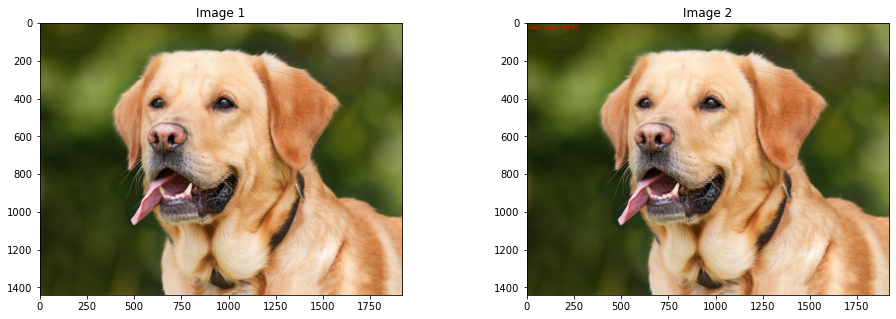

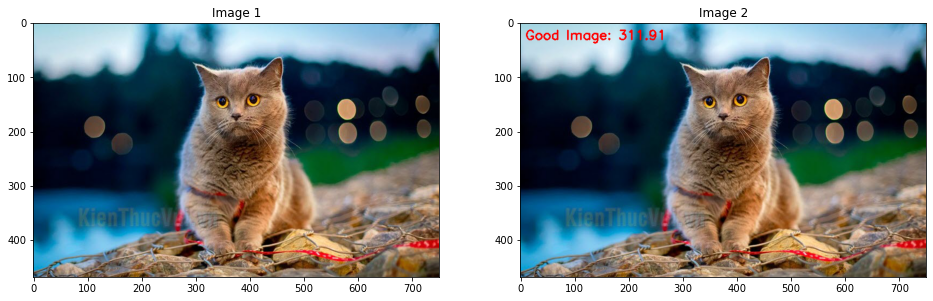

In [79]:
# BLUR IMAGES:
## Ảnh 1:
text = "Blur Image"
fm_1 = blur_mesurement_0
img1_text = blur_img1.copy()
cv2.putText(img1_text, "{}: {:.2f}".format(text, fm_1), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(blur_img1, img1_text)

## Ảnh 2:
text = "Blur Image"
fm_2 = blur_mesurement_1
img2_text = blur_img2.copy()
cv2.putText(img2_text, "{}: {:.2f}".format(text, fm_2), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(blur_img2, img2_text)

##Ảnh 3:
text = "Good Image"
fm_3 = blur_mesurement_2
img3_text = gud_img3.copy()
cv2.putText(img3_text, "{}: {:.2f}".format(text, fm_3), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(gud_img3, img3_text)

##Ảnh 4:
text = "Good Image"
fm_4 = blur_mesurement_3
img4_text = gud_img4.copy()
cv2.putText(img4_text, "{}: {:.2f}".format(text, fm_4), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(gud_img4, img4_text)

##Ảnh 5:
text = "Good Image"
fm_5 = blur_mesurement_4
img5_text = gud_img5.copy()
cv2.putText(img5_text, "{}: {:.2f}".format(text, fm_5), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(gud_img5, img5_text)


## Tất cả các ảnh sau khi đánh giá được lưu vào một thư mục “Image_BlurDetection_Output”

In [80]:
from PIL import Image
import numpy as np

# Img1_text:
img = Image.fromarray(img1_text, "RGB")
# Display the Numpy array as Image
img.show()

# Save the Numpy array as Image
image_filename = "D:\TNHien\ĐH-KHTN\Phân tích & Xử lý ảnh\Lab03\Image_BlurDetection_Output\img1.png"
img.save(image_filename)

# Img2_text:
img = Image.fromarray(img2_text, "RGB")
# Display the Numpy array as Image
img.show()

# Save the Numpy array as Image
image_filename = "D:\TNHien\ĐH-KHTN\Phân tích & Xử lý ảnh\Lab03\Image_BlurDetection_Output\img2.png"
img.save(image_filename)

# Img3_text:
img = Image.fromarray(img3_text, "RGB")
# Display the Numpy array as Image
img.show()

# Save the Numpy array as Image
image_filename = "D:\TNHien\ĐH-KHTN\Phân tích & Xử lý ảnh\Lab03\Image_BlurDetection_Output\img3.png"
img.save(image_filename)

# Img4_text:
img = Image.fromarray(img4_text, "RGB")
# Display the Numpy array as Image
img.show()

# Save the Numpy array as Image
image_filename = "D:\TNHien\ĐH-KHTN\Phân tích & Xử lý ảnh\Lab03\Image_BlurDetection_Output\img4.png"
img.save(image_filename)

# Img5_text:
img = Image.fromarray(img5_text, "RGB")
# Display the Numpy array as Image
img.show()

# Save the Numpy array as Image
image_filename = "D:\TNHien\ĐH-KHTN\Phân tích & Xử lý ảnh\Lab03\Image_BlurDetection_Output\img5.png"
img.save(image_filename)


# Câu 4:
## Xuất ảnh từng điểm ảnh hiển thị giá trị RGBMax 

In [81]:
def max_rgb_filter(image):
    # split the image into its BGR components
    (B, G, R) = cv2.split(image)
    # find the maximum pixel intensity values for each
    # (x, y)-coordinate,, then set all pixel values less
    # than M to zero
    M = np.maximum(np.maximum(R, G), B)
    R[R < M] = 0
    G[G < M] = 0
    B[B < M] = 0
    # merge the channels back together and return the image
    return cv2.merge([B, G, R])

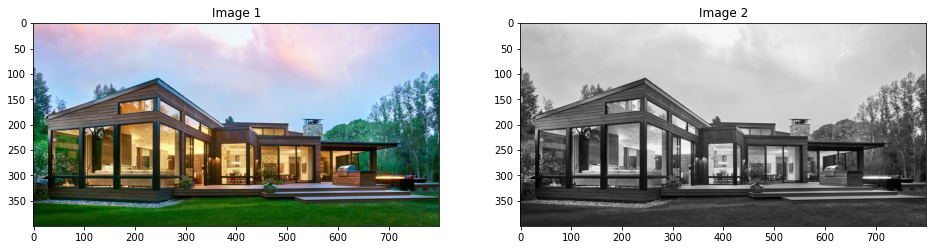

In [82]:
# Read Image 
image_color = imread("sun-house.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

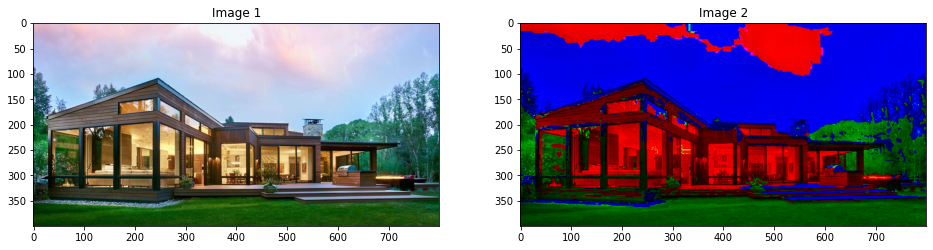

In [83]:
image_color_rgbmax = max_rgb_filter(image_color)
ShowTwoImages(image_color, image_color_rgbmax)

## Xuất các vị trí có giá trị R đạt max, G đạt max và B đạt max

In [84]:
def SegmentColorImageByMask(IM, Mask):    
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

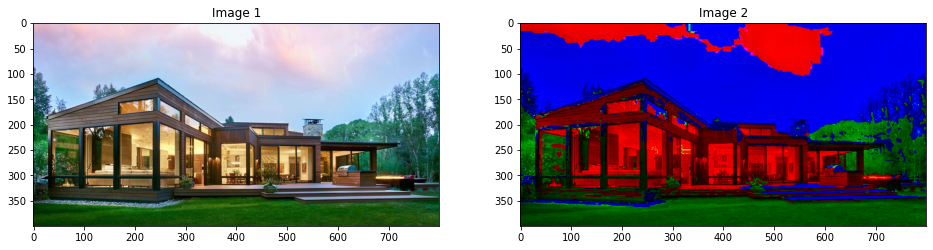

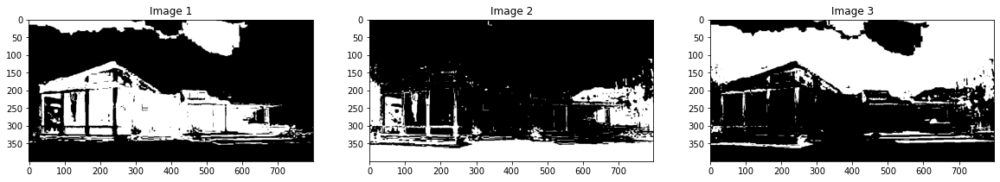

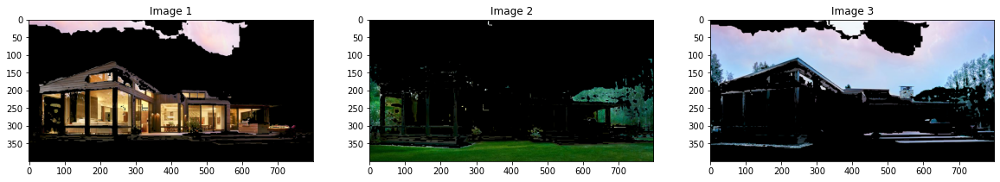

In [85]:
image_maxR_mask = image_gray < 0
image_maxG_mask = image_gray < 0
image_maxB_mask = image_gray < 0

R = image_color_rgbmax[:,:,0]
G = image_color_rgbmax[:,:,1]
B = image_color_rgbmax[:,:,2]

image_maxR_mask[(G == 0) & (B == 0)] = 1
image_maxG_mask[(R == 0) & (B == 0)] = 1
image_maxB_mask[(G == 0) & (R == 0)] = 1

image_maxR = SegmentColorImageByMask(image_color, image_maxR_mask)
image_maxG = SegmentColorImageByMask(image_color, image_maxG_mask)
image_maxB = SegmentColorImageByMask(image_color, image_maxB_mask)

ShowTwoImages(image_color, image_color_rgbmax)
ShowThreeImages(image_maxR_mask, image_maxG_mask, image_maxB_mask)
ShowThreeImages(image_maxR, image_maxG, image_maxB)

## Thực hiện làm mờ ảnh rồi sau đó làm rõ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không

Filtering Kernel 3x3:


array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

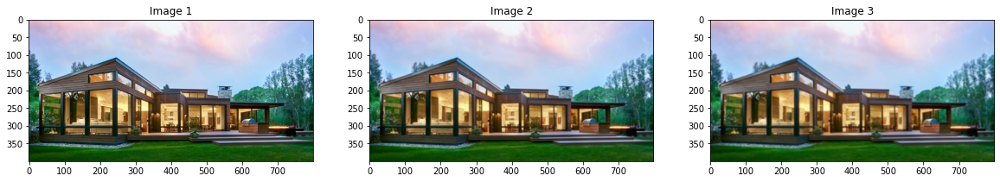

Filtering Kernel 5x5:


array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

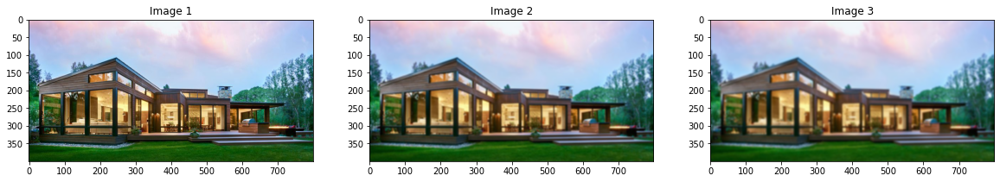

In [86]:
kernel_3_3 = np.ones((3,3),np.float32)/9
kernel_5_5 = np.ones((5,5),np.float32)/25
print("Filtering Kernel 3x3:")
display(kernel_3_3)

image_filter_3_3_01 = cv2.filter2D(image_color,-1,kernel_3_3)
image_filter_3_3_02 = cv2.filter2D(image_filter_3_3_01,-1,kernel_3_3)
ShowThreeImages(image_color, image_filter_3_3_01, image_filter_3_3_02)


print("Filtering Kernel 5x5:")
display(kernel_5_5)

image_filter_5_5_01 = cv2.filter2D(image_color,-1,kernel_5_5)
image_filter_5_5_02 = cv2.filter2D(image_filter_5_5_01,-1,kernel_5_5)


ShowThreeImages(image_color, image_filter_5_5_01, image_filter_5_5_02)

In [87]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)
blur_mesurement_3_3_02 = variance_of_laplacian(image_filter_3_3_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_3_3_01:", blur_mesurement_3_3_01)
print("Blur Measurement of image_filter_3_3_02:", blur_mesurement_3_3_02)

Blur Measurement of image_color: 1719.7160932213444
Blur Measurement of image_filter_3_3_01: 141.5949381126725
Blur Measurement of image_filter_3_3_02: 50.571895452446824


In [88]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_5_5_01 = variance_of_laplacian(image_filter_5_5_01)
blur_mesurement_5_5_02 = variance_of_laplacian(image_filter_5_5_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_5_5_01:", blur_mesurement_5_5_01)
print("Blur Measurement of image_filter_5_5_02:", blur_mesurement_5_5_02)

Blur Measurement of image_color: 1719.7160932213444
Blur Measurement of image_filter_5_5_01: 41.87217069426649
Blur Measurement of image_filter_5_5_02: 10.358594665493703


### $\rightarrow$ Giá trị độ đo mờ không giống so với ảnh gốc


## Thưc hiện làm rõ ảnh rồi sau đó làm mờ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không

### Kernel 3x3

Filtering kernel_sharpen_01:


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Filtering kernel_sharpen_02:


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

Image before sharpen:


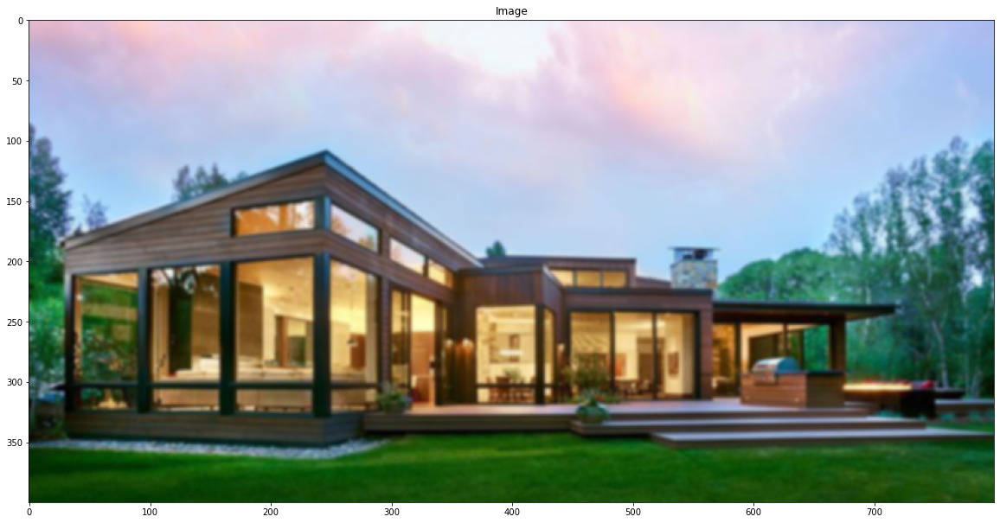

Image after sharpen:


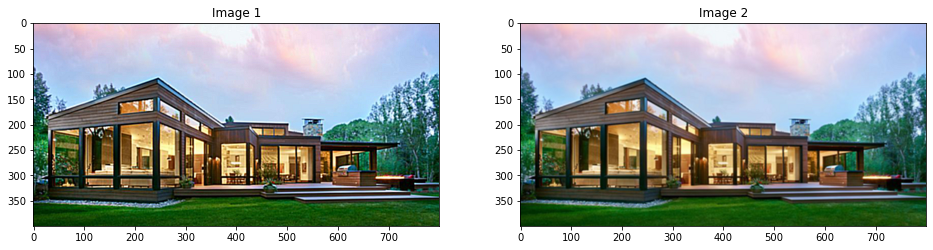

In [89]:
kernel_sharpen_01 = np.array([[-1,-1,-1], 
                              [-1, 9,-1], 
                              [-1,-1,-1]])

kernel_sharpen_02 = np.array(([0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]), dtype="int")

print("Filtering kernel_sharpen_01:")
display(kernel_sharpen_01)

print("Filtering kernel_sharpen_02:")
display(kernel_sharpen_02)

image_3_3_color_sharpen_01 = cv2.filter2D(image_filter_3_3_02, -1, kernel_sharpen_01)

image_3_3_color_sharpen_02 = cv2.filter2D(image_filter_3_3_02, -1, kernel_sharpen_02)

print("Image before sharpen:")
ShowOneImage(image_filter_3_3_02)

print("Image after sharpen:")
ShowTwoImages(image_3_3_color_sharpen_01, image_3_3_color_sharpen_02)

### Kernel 5x5

Filtering kernel_sharpen_01:


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Filtering kernel_sharpen_02:


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

Image before sharpen:


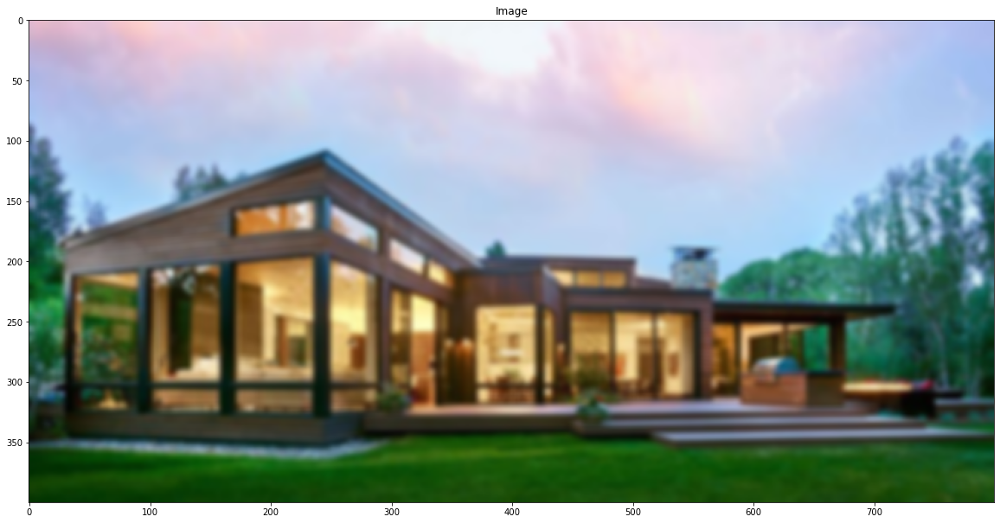

Image after sharpen:


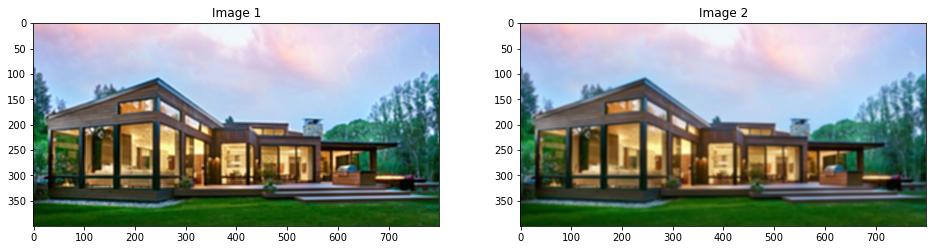

In [90]:
kernel_sharpen_01 = np.array([[-1,-1,-1], 
                              [-1, 9,-1], 
                              [-1,-1,-1]])

kernel_sharpen_02 = np.array(([0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]), dtype="int")

print("Filtering kernel_sharpen_01:")
display(kernel_sharpen_01)

print("Filtering kernel_sharpen_02:")
display(kernel_sharpen_02)

image_5_5_color_sharpen_01 = cv2.filter2D(image_filter_5_5_02, -1, kernel_sharpen_01)

image_5_5_color_sharpen_02 = cv2.filter2D(image_filter_5_5_02, -1, kernel_sharpen_02)

print("Image before sharpen:")
ShowOneImage(image_filter_5_5_02)

print("Image after sharpen:")
ShowTwoImages(image_5_5_color_sharpen_01, image_5_5_color_sharpen_02)

In [91]:
sharpen_mesurement = variance_of_laplacian(image_color)
sharpen_mesurement_3_3_01 = variance_of_laplacian(image_3_3_color_sharpen_01)
sharpen_mesurement_3_3_02 = variance_of_laplacian(image_3_3_color_sharpen_02)
print("Sharpen Measurement of image_color:", sharpen_mesurement)
print("Sharpen Measurement of image_3_3_color_sharpen_01:", sharpen_mesurement_3_3_01)
print("Sharpen Measurement of image_3_3_color_sharpen_02:", sharpen_mesurement_3_3_02)

Sharpen Measurement of image_color: 1719.7160932213444
Sharpen Measurement of image_3_3_color_sharpen_01: 1041.912198939712
Sharpen Measurement of image_3_3_color_sharpen_02: 285.75042379914925


In [92]:
sharpen_mesurement = variance_of_laplacian(image_color)
sharpen_mesurement_5_5_01 = variance_of_laplacian(image_5_5_color_sharpen_01)
sharpen_mesurement_5_5_02 = variance_of_laplacian(image_5_5_color_sharpen_02)
print("Sharpen Measurement of image_color:", sharpen_mesurement)
print("Sharpen Measurement of image_5_5_color_sharpen_01:", sharpen_mesurement_5_5_01)
print("Sharpen Measurement of image_5_5_color_sharpen_02:", sharpen_mesurement_5_5_02)

Sharpen Measurement of image_color: 1719.7160932213444
Sharpen Measurement of image_5_5_color_sharpen_01: 259.5669312430555
Sharpen Measurement of image_5_5_color_sharpen_02: 95.68324787749569


### $\rightarrow$ Giá trị độ đo mờ không giống so với ảnh gốc


## Tìm cạnh và tạo ra các ảnh về cạnh sau : ảnh cạnh ngang, cạnh dọc và ảnh cạnh tổng 

In [93]:
# construct the Laplacian kernel used to detect edge-like
# regions of an image
# construct the Sobel x-axis kernel
kernel_sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")
 
# construct the Sobel y-axis kernel
kernel_sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

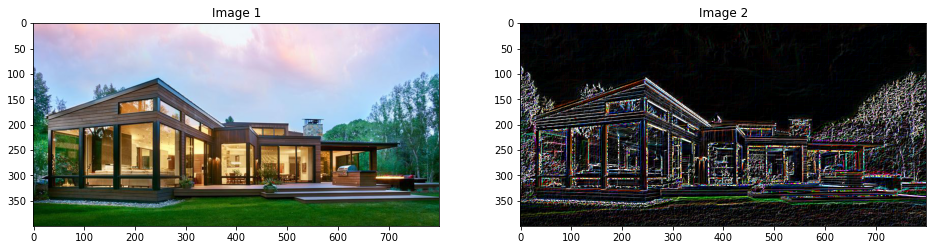

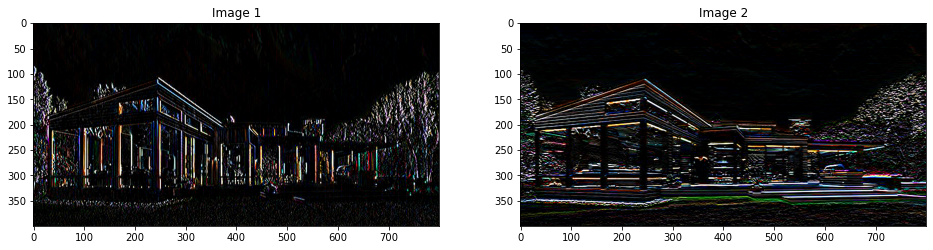

In [94]:
image_color_edge_sobelX = cv2.filter2D(image_color, -1, kernel_sobelX)
image_color_edge_sobelY = cv2.filter2D(image_color, -1, kernel_sobelY)
image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY

ShowTwoImages(image_color, image_color_edge)
ShowTwoImages(image_color_edge_sobelX, image_color_edge_sobelY)